## LSTM with horizon

In [1]:
import numpy as np

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense, Dropout
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns

#Read the csv file
df = pd.read_csv('../data/Processed_Data/gate_00015_after.csv')

In [2]:

# 1. Ensure timestamp column is in datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Set the timestamp column as the index
df.set_index('timestamp', inplace=True)

# Resample to 1-minute interval and compute rolling mean or any agg
df_resampled = df.resample('1T').mean()  # 

/var/folders/65/28_dhw4177qgtmqz53kc5m040000gp/T/ipykernel_75722/209415964.py:8: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  df_resampled = df.resample('1T').mean()  #


In [3]:
df_resampled

,lbr_extr_fan_1.vfd_output,lbr_rc.dp_over_main_filter_value
timestamp,,
2022-09-13 23:59:00,100.0,179.618294
2022-09-14 00:00:00,100.0,184.034943
2022-09-14 00:01:00,100.0,174.308083
2022-09-14 00:02:00,100.0,186.854836
2022-09-14 00:03:00,100.0,188.294060
...,...,...
2024-03-15 11:18:00,0.0,0.000000
2024-03-15 11:19:00,0.0,0.000000
2024-03-15 11:20:00,0.0,0.000000


## Objective 

Use vfd_output to predict the over the main filter

## Dynamic value with no Horizon 

In [4]:
df_resampled.fillna(df_resampled.mean(), inplace=True)

In [18]:
df_resampled[df_resampled['lbr_extr_fan_1.vfd_output']>0.1]

,lbr_extr_fan_1.vfd_output,lbr_rc.dp_over_main_filter_value
timestamp,,
2022-09-13 23:59:00,100.0,179.618294
2022-09-14 00:00:00,100.0,184.034943
2022-09-14 00:01:00,100.0,174.308083
2022-09-14 00:02:00,100.0,186.854836
2022-09-14 00:03:00,100.0,188.294060
...,...,...
2024-03-14 19:44:00,100.0,201.210770
2024-03-14 19:45:00,100.0,201.851654
2024-03-14 19:46:00,100.0,206.766296


In [6]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense,Input

# Example: Load your data
df = df_resampled  # replace with your actual file
# Why reshape 
## Be interpreted as n features in one sample, which is wrong.
# Why (-1,1)-> Explicitly 2D (samples × features)->Compatible with MinMaxScaler, LSTM formatting, and most ML frameworks
X_data = df['lbr_extr_fan_1.vfd_output'].values.reshape(-1, 1)
Y_data = df['lbr_rc.dp_over_main_filter_value'].values.reshape(-1, 1)

# Normalize (recommended for LSTM)
scaler_X = MinMaxScaler()
scaler_Y = MinMaxScaler()
X_scaled = scaler_X.fit_transform(X_data)
Y_scaled = scaler_Y.fit_transform(Y_data)


In [7]:
def create_sequences(X, Y, sequence_length):
    X_seq = []
    Y_seq = []
    for i in range(len(X) - sequence_length):
        X_seq.append(X[i:i+sequence_length])
        Y_seq.append(Y[i+sequence_length])
    return np.array(X_seq), np.array(Y_seq)

sequence_length = 20  # number of past steps to look at
X_seq, Y_seq = create_sequences(X_scaled, Y_scaled, sequence_length)


In [8]:
train_size = int(len(df_resampled) * 0.2)  # 20% train, 80% test
X_train, X_test = X_seq[:train_size], X_seq[train_size:]
Y_train, Y_test = Y_seq[:train_size], Y_seq[train_size:]

In [ ]:
# activation is like scaling
# optimizer adapts the learning rate for each parameter->reduces tuning requirements,works wiht sparse gradient
## SGD acannot handle sparse gradients so it is least preferred, RMSPROP as well as SGD does not use momentum and SGD does not learn 
'''
moment - take into account not just the current gradient, but also the direction and speed of past gradients take into account
not just the current gradient, but also the direction and speed of past gradients
'''

model = Sequential([
    Input(shape=(X_train.shape[1], X_train.shape[2])),  # (timesteps, features)
    LSTM(64,return_sequences=True),
    LSTM(4),
    Dense(1)  # or use Y_train.shape[1] if you're predicting more than one value
])

In [10]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 20, 16)         │         1,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 4)              │           336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,493 (5.83 KB)

 Trainable params: 1,493 (5.83 KB)

 Non-trainable params: 0 (0.00 B)

In [16]:
model.compile(optimizer='adam', loss='mse')
model.fit(X_train, Y_train, epochs=5, batch_size=128)

Epoch 1/5
1235/1235 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 7.2745e-04
Epoch 2/5
1235/1235 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 7.0446e-04
Epoch 3/5
1235/1235 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 7.0904e-04
Epoch 4/5
1235/1235 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 7.0936e-04
Epoch 5/5
1235/1235 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 6.9604e-04


In [12]:
# Predict
Y_pred = model.predict(X_test)

# Inverse transform to get original scale
Y_pred_inv = scaler_Y.inverse_transform(Y_pred).flatten()
Y_true_inv = scaler_Y.inverse_transform(Y_test).flatten()


19745/19745 ━━━━━━━━━━━━━━━━━━━━ 18s 900us/step


In [13]:
Y_pred_inv

array([-0.59493554, -0.59493554, -0.59493554, ..., -0.59493554,
       -0.59493554, -0.59493554], dtype=float32)

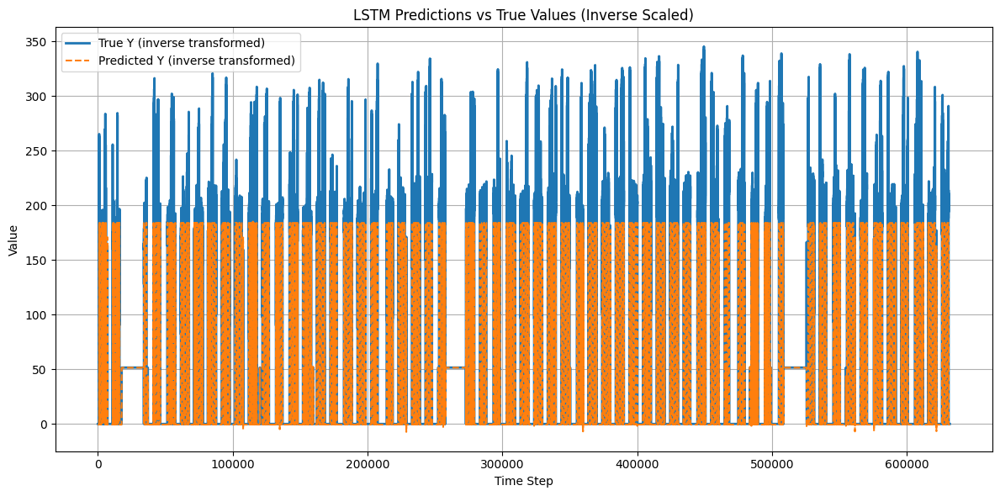

In [14]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(Y_true_inv, label='True Y (inverse transformed)', linewidth=2)
plt.plot(Y_pred_inv, label='Predicted Y (inverse transformed)', linestyle='--')
plt.title("LSTM Predictions vs True Values (Inverse Scaled)")
plt.xlabel("Time Step")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [15]:
import plotly.graph_objs as go


fig = go.Figure()
fig.add_trace(go.Scatter(y=Y_true_inv, mode='lines', name='Actual', line=dict(color='blue')))
fig.add_trace(go.Scatter(y=Y_pred_inv, mode='lines', name='Predicted', line=dict(color='red')))

fig.update_layout(title='Actual vs Predicted DP (TFLite Workflow)',
                  xaxis_title='Sample Index', yaxis_title='Turn Speed')
fig.show()
